In [1]:
import os, pandas as pd
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

# Ignore 
from warnings import simplefilter
simplefilter("ignore")

# Set up directory
# lder = os.path.dirname(__file__)
path = os.path.join('dyninfluent_bsm2.csv')

In [2]:
# Import data
columns = [
    't', # time, [d]
    'S_I',      # inert soluble material, g COD/m3
    'S_S',      # readily biodegradable substrate, g COD/m3
    'X_I',      # inert particulate material, g COD/m3
    'X_S',      # slowly biodegradable substrate, g COD/m3
    'X_BH',     # heterotrophic biomass, g COD/m3
    'X_BA',     # autotrophic biomass, g COD/m3
    'X_P',      # inert particulate material from biomass decay, g COD/m3
    'S_O',      # dissolved oxygen, g COD/m3
    'S_NO',     # nitrate and nitrite, g N/m3
    'S_NH',     # ammonia and ammonium, g N/m3
    'S_ND',     # soluble organic nitrogen associated with SS, g N/m3
    'X_ND',     # particulate organic nitrogen associated with XS, g N/m3
    'S_ALK',    # alkalinity
    'TSS',      # total suspended solids, g SS/m3
    'Q',        # flow rate, m3/d
    'T',        # temperature, °C
    'S_D1',     # dummy variable (soluble) no 1
    'S_D2',     # dummy variable (soluble) no 2
    'S_D3',     # dummy variable (soluble) no 3
    'X_D4',     # dummy variable (particulate) no 1
    'X_D5',     # dummy variable (particulate) no 2
    ]
df = pd.read_csv(path, header=None, names=columns)

# Throw out the last five columns (all dummies)
data = df.iloc[:, :-5].copy()
columns = columns[:-5]

In [3]:
# Extract and split data
def data_preparation(
        data,
        features=['T', 'Q'],
        target='S_I',
        test_size=0.25,
        ):
    # Extract data
    X = data[features].copy()
    y = data[[target]].copy()   
    
    # Split training and test data
    idx_train, idx_test = train_test_split(
        y.index, test_size=test_size, shuffle=False,
    )
    X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
    y_train, y_test = y.loc[idx_train], y.loc[idx_test]
    return X_train, X_test, y_train, y_test

# Plot and calculate error (normalized root mean squared error)
def evaluate(y_train, y_test, y_train_pred, y_test_pred, figsize, info):
    rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
    nrmse_train = (rmse_train/y_train.mean()).values[0]
    rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
    nrmse_test = (rmse_test/y_test.mean()).values[0]
    
    print(f'Normalized RMSE for training data: {nrmse_train:2f}.')
    print(f'Normalized RMSE for testing data: {nrmse_test:2f}.')
    
    axs = y_train.plot(color='0.25', subplots=True, sharex=True, figsize=figsize)
    axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
    axs = y_train_pred.plot(color='C0', subplots=True, sharex=True, ax=axs)
    axs = y_test_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
    for ax in axs: ax.legend([])
    kind, features, target = info
    plt.suptitle(f'{kind.capitalize()} prediction - features: {features} - target: {target}')
    return nrmse_train, nrmse_test, axs

# Trend prediction only through linear regression
def single_prediction(
        kind='regression',
        features=['T', 'Q'],
        target='S_I',
        test_size=0.25,
        figsize=(50, 2),
        ):
    # Prepare data
    X_train, X_test, y_train, y_test = data_preparation(data, features, target, test_size)
    
    # Fit model
    if kind == 'regression':
        # Trend prediction only through linear regression
        model = LinearRegression(fit_intercept=False)
    else:
        # Residual prediction only through XGBoost 
        model = XGBRegressor()
    model.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = pd.DataFrame(
        model.predict(X_train),
        index=y_train.index,
        columns=y_train.columns,
    )
    y_test_pred = pd.DataFrame(
        model.predict(X_test),
        index=y_test.index,
        columns=y_test.columns,
    )
    if kind == 'hybrid': return y_train, y_test, y_train_pred, y_test_pred
    info = [kind] + features + [target]
    return evaluate(y_train, y_test, y_train_pred, y_test_pred, figsize, info)


# Hybrid approach using both trend and residual predictions
def hybrid_prediction(
        features=['T', 'Q'],
        target='S_I',
        test_size=0.25,
        figsize=(50, 2),
        ):
    # Prepare data
    X_train, X_test, y_train, y_test = data_preparation(data, features, target, test_size)
    
    # Fit trend model
    y_train, y_test, y_train_pred, y_test_pred = single_prediction(
        'hybrid', features, target, test_size, figsize)
    
    # Create residuals (the collection of detrended series) from the training set
    y_train_resid = y_train - y_train_pred
    # Train XGBoost on the residuals
    xgb = XGBRegressor()
    xgb.fit(X_train, y_train_resid)
    
    # Add the predicted residuals onto the predicted trends
    y_train_resid_pred = xgb.predict(X_train)
    y_train_resid_pred = y_train_resid_pred.reshape(y_train_pred.shape)
    y_train_boosted = y_train_resid_pred + y_train_pred

    y_test_pred_resid = xgb.predict(X_test)
    y_test_pred_resid = y_test_pred_resid.reshape(y_test_pred.shape)
    y_test_pred_boosted = y_test_pred_resid + y_test_pred

    info = ['hybrid'] + features + [target]
    return evaluate(y_train, y_test, y_train_boosted, y_test_pred_boosted, figsize, info)

def predict(
        features=['S_I'],
        target='S_S',
        test_size=0.25,
        ):
    text = f'\nPredicting {target} using {features}:'
    print(text)
    print(''.join(['-']*(len(text)-1)))
    print('Trend prediction:')
    err = [single_prediction('regression', features, target, test_size)[1]]
    print('\nResidual prediction:')
    err.append(single_prediction('residual', features, target, test_size)[1])
    print('\nHybrid prediction:')
    err.append(hybrid_prediction(features, target, test_size)[1])
    return err


Predicting S_S using ['S_NH']:
------------------------------
Trend prediction:
Normalized RMSE for training data: 0.224449.
Normalized RMSE for testing data: 0.220531.

Residual prediction:
Normalized RMSE for training data: 0.217743.
Normalized RMSE for testing data: 0.214175.

Hybrid prediction:
Normalized RMSE for training data: 0.217743.
Normalized RMSE for testing data: 0.214198.


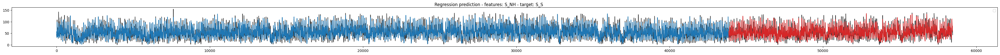

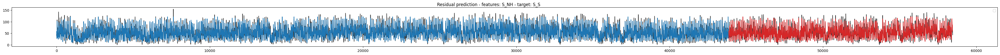

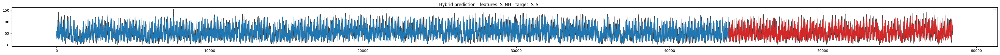

In [4]:
# To test a certain feature for prediction
# Blank is real data, blue is training data, red is test data, RMSE is root mean squared error.
err = predict(features=['S_NH'], target='S_S')


Predicting S_S using ['t']:
---------------------------
Trend prediction:
Normalized RMSE for training data: 0.710965.
Normalized RMSE for testing data: 0.917422.

Residual prediction:
Normalized RMSE for training data: 0.490697.
Normalized RMSE for testing data: 0.510875.

Hybrid prediction:
Normalized RMSE for training data: 0.490667.
Normalized RMSE for testing data: 0.510869.

Predicting S_S using ['S_I']:
-----------------------------
Trend prediction:
Normalized RMSE for training data: 0.488932.
Normalized RMSE for testing data: 0.482353.

Residual prediction:
Normalized RMSE for training data: 0.484738.
Normalized RMSE for testing data: 0.483295.

Hybrid prediction:
Normalized RMSE for training data: 0.484735.
Normalized RMSE for testing data: 0.483409.

Predicting S_S using ['X_I']:
-----------------------------
Trend prediction:
Normalized RMSE for training data: 0.409914.
Normalized RMSE for testing data: 0.403297.

Residual prediction:
Normalized RMSE for training data: 0.4

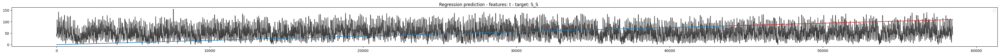

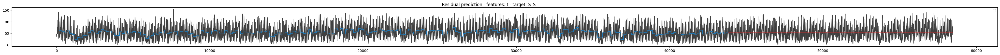

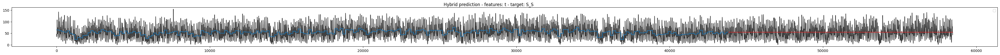

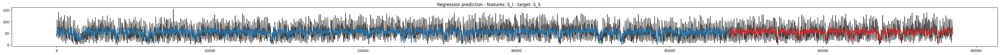

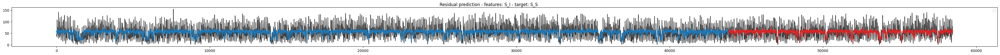

...

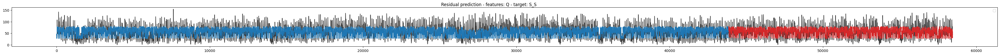

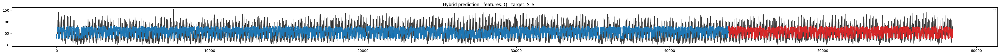

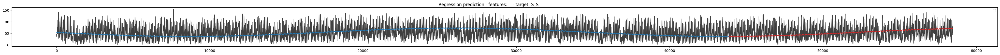

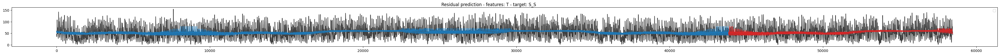

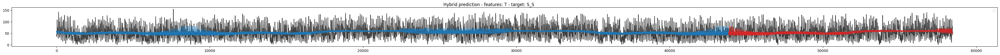

In [5]:
# If want to test for all features
def test_features(target='S_S'):
    err_dct = {}
    for feature in columns:
        if feature == target: continue
        err_dct[feature] = predict(features=[feature], target='S_S')
    df = pd.DataFrame.from_dict(err_dct).T
    df.columns = ['Trend', 'Residual', 'Hybrid']
    return df

# Running the following line will print LOTS of results
df = test_features(target='S_S')